In [1]:
%matplotlib inline

# 1) Wipe out your namespace
%reset -f

# 2) Clear Jupyter’s stored outputs (and inputs if you like)
try:
    Out.clear() 
except NameError:
    pass

try:
    In.clear()
except NameError:
    pass

# 3) Force Python GC
import gc
gc.collect()

# 4) Free any GPU buffers
import torch
if torch.cuda.is_available():
    torch.cuda.empty_cache()


import importlib
from libs import trades, plots, params, feats, strategies
importlib.reload(trades)
importlib.reload(plots)
importlib.reload(params)
importlib.reload(feats)
importlib.reload(strategies)

<module 'libs.strategies' from '/workspace/my_models/Trading/_Stock_Analysis_/libs/strategies.py'>

In [2]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns

import glob
import os
import json
import re
import os
import psutil

import time
import datetime as dt
from tqdm.auto import tqdm
from IPython.display import clear_output, display

In [3]:
# Read the unscaled indicators dataframe (only the test part)

df_inds_test = pd.read_csv(params.indunsc_test_csv, index_col=0, parse_dates=True)
# compute synthetic ask/bid from close_raw and configured spread
df_inds_test['ask'] = df_inds_test['close'] * (1 + params.bidask_spread_pct/100)
df_inds_test['bid'] = df_inds_test['close'] * (1 - params.bidask_spread_pct/100)
df_inds_test['rsi_thresh'] = params.rsi_thresh_tick

df_inds_test

,open,high,low,close,volume,signal,ret,log_ret,sma_9,sma_21,sma_pct_9,sma_pct_21,ema_9,ema_21,roc_9,roc_21,body,body_pct,upper_shad,lower_shad,range_pct,rsi_6,macd_line,macd_signal,macd_diff,atr_14,atr_pct_14,bb_lband_20,bb_hband_20,bb_w_20,plus_di,minus_di,adx,obv,vwap_14,vwap_dev_pct_14,vol_spike,vol_z_14,rolling_max_close_21,rolling_min_close_21,dist_high_21,dist_low_21,obv_sma,obv_diff_14,obv_pct_14,obv_sma_14,obv_z_14,ret_30,sma_30,sma_pct_30,ema_30,roc_30,rsi_30,atr_30,atr_pct_30,bb_lband_30,bb_hband_30,bb_w_30,plus_di_30,minus_di_30,adx_30,obv_diff_30,obv_pct_30,obv_sma_30,obv_z_30,vwap_30,vwap_dev_pct_30,z_vwap_dev_30,vol_spike_30,vol_z_30,ret_std_30,rolling_max_close_30,rolling_min_close_30,dist_high_30,dist_low_30,macd_line_30,macd_signal_30,macd_diff_30,ret_45,sma_45,sma_pct_45,ema_45,roc_45,rsi_45,atr_45,atr_pct_45,bb_lband_45,bb_hband_45,bb_w_45,plus_di_45,minus_di_45,adx_45,obv_diff_45,obv_pct_45,obv_sma_45,obv_z_45,vwap_45,vwap_dev_pct_45,z_vwap_dev_45,vol_spike_45,vol_z_45,ret_std_45,rolling_max_close_45,rolling_min_close_45,dist_high_45,dist_low_45,macd_line_45,macd_signal_45,macd_diff_45,ret_60,sma_60,sma_pct_60,ema_60,roc_60,rsi_60,atr_60,atr_pct_60,bb_lband_60,bb_hband_60,bb_w_60,plus_di_60,minus_di_60,adx_60,obv_diff_60,obv_pct_60,obv_sma_60,obv_z_60,vwap_60,vwap_dev_pct_60,z_vwap_dev_60,vol_spike_60,vol_z_60,ret_std_60,rolling_max_close_60,rolling_min_close_60,dist_high_60,dist_low_60,macd_line_60,macd_signal_60,macd_diff_60,volume_z_30,vol_spike_z_30,ret_std_z_30,obv_pct_z_30,vwap_dev_pct_z_30,bb_w_z_30,atr_z_30,macd_diff_z_30,volume_z_45,vol_spike_z_45,ret_std_z_45,obv_pct_z_45,vwap_dev_pct_z_45,bb_w_z_45,atr_z_45,macd_diff_z_45,volume_z_60,vol_spike_z_60,ret_std_z_60,obv_pct_z_60,vwap_dev_pct_z_60,bb_w_z_60,atr_z_60,macd_diff_z_60,minute_time,hour_time,dow_time,month_time,day_of_year_time,week_of_year_time,in_sess_time,eng_ma,eng_macd,eng_bb,eng_bb_mid,eng_rsi,eng_adx,eng_obv,eng_atr_div,z_eng_atr,eng_sma_short,eng_sma_long,eng_vwap,z_vwap_dev,z_bb_w,z_obv,mom_sum_30,mom_std_30,mom_sum_45,mom_std_45,mom_sum_60,mom_std_60,eng_ema_cross_up,eng_ema_cross_down,ask,bid,rsi_thresh
2022-12-23 10:58:00,132.506667,132.506667,132.506667,132.506667,3.766667e+02,0.068838,-0.000025,-0.000025,132.517407,132.463651,-0.000081,0.000325,132.501714,132.450580,0.000126,0.000428,0.000,0.000000,0.000,0.000,0.000000,55.324571,0.066914,0.076274,-0.009361,0.030896,0.000233,132.351547,132.577120,0.001703,53.329334,22.545811,52.004170,4.810433e+04,132.024282,0.365375,0.462019,-0.911671,132.540,132.36,0.000252,0.001107,4.767483e+04,4.656333e+03,35.146275,4.767483e+04,0.269138,0.002547,132.419889,0.000655,132.403860,0.002547,67.514546,0.034648,0.000261,132.220285,132.619493,0.003015,49.033670,19.075239,40.643327,1.196033e+04,90.321276,4.478294e+04,0.370286,132.417943,0.067003,-1.435313,0.424020,-0.936193,0.000271,132.540,132.20,0.000252,0.002314,0.084061,0.080324,0.003737,0.003663,132.310329,0.001484,132.330747,0.003663,67.477198,0.037214,0.000281,131.957731,132.662926,0.005330,45.383192,19.249055,28.521447,2.131996e+04,161.136009,4.104582e+04,0.244755,132.288077,0.165238,-0.378640,0.394909,-1.100015,0.000230,132.540,132.028750,0.000252,0.003607,0.072126,0.069040,0.003086,0.004638,132.228319,0.002105,132.270541,0.004638,66.814987,0.038612,0.000291,131.810366,132.646273,0.006322,43.207120,20.127475,0.000000,4.737383e+04,358.272975,3.439157e+04,0.345499,132.165188,0.258373,0.724499,0.327654,-1.358106,0.000201,132.540,131.922500,0.000252,0.004409,0.063599,0.059554,0.004045,-0.467325,-0.000002,0.190732,-0.326255,-0.796174,-0.714829,-2.471902,-20.000000,-0.677505,-0.000002,20.000000,-20.000000,-20.000000,20.000000,-1.096288,0.000000,-0.861826,-1.606155e-11,0.000000,0.000000,20.000000,20.000000,-0.187204,0.000000,0.352778,0.312500,0.071429,0.416667,0.475342,0.461538,0.0,0.000406,-0.000071,0.00000,-0.000319,0.000000,0.098520,0.099620,-0.242750,-1.828533,0.000081,-0.000325,-99.724259,-0.805629,0.201443,-0.950054,0.087051,0.000484,0.145175

In [4]:
# trad_comb={'col_signal': 'obv_sma', 'sign_thresh': 'obv_sma_14'}, reset_peak=True, trailstop_pct=0.0109, rsi_thresh=64.00, atr_mult=0.486, vwap_atr_mult=3.259, invest_frac=0.40600354583578646, buy_factor=0.06414540391177836, sell_factor=0.3827894628317236, sess_start=13:30:00

# atr_mult

In [15]:
importlib.reload(params) #####
importlib.reload(strategies) #####
df_inds_test = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check] ################################

sim_results = {}
groups = df_inds_test.groupby(df_inds_test.index.normalize())
total_days = df_inds_test.index.normalize().nunique()
col_signal = "ema_9"
sign_thresh = "ema_21"

for day, df_day_sim in tqdm(groups, desc="Generate+Simulate", total=total_days):
    
    df_actions = strategies.generate_tradact_elab(
        df              = df_day_sim,
        col_signal      = col_signal,
        sign_thresh     = sign_thresh,
        col_atr         = "atr_14",
        col_rsi         = "rsi_6",
        col_vwap        = "vwap_14",
        reset_peak      = False,
        rsi_thresh      = params.rsi_thresh_tick,
        trailstop_pct   = params.trailstop_pct_tick,
        atr_mult        = params.atr_mult_tick,
        vwap_atr_mult   = params.vwap_atr_mult_tick,
        sess_start      = params.sess_start_tick
    )
    
    sim_results.update(
        strategies.simulate_trading(
            day         = day,
            df          = df_actions,
            invest_frac = 0.1,
            buy_factor  = 0.5,
            sell_factor = 0.3,
            sess_start  = params.sess_start_tick
        )
    )

print("Loop finished. Days simulated:", len(sim_results))





Generate+Simulate:   0%|          | 0/20 [00:00<?, ?it/s]

Loop finished. Days simulated: 20


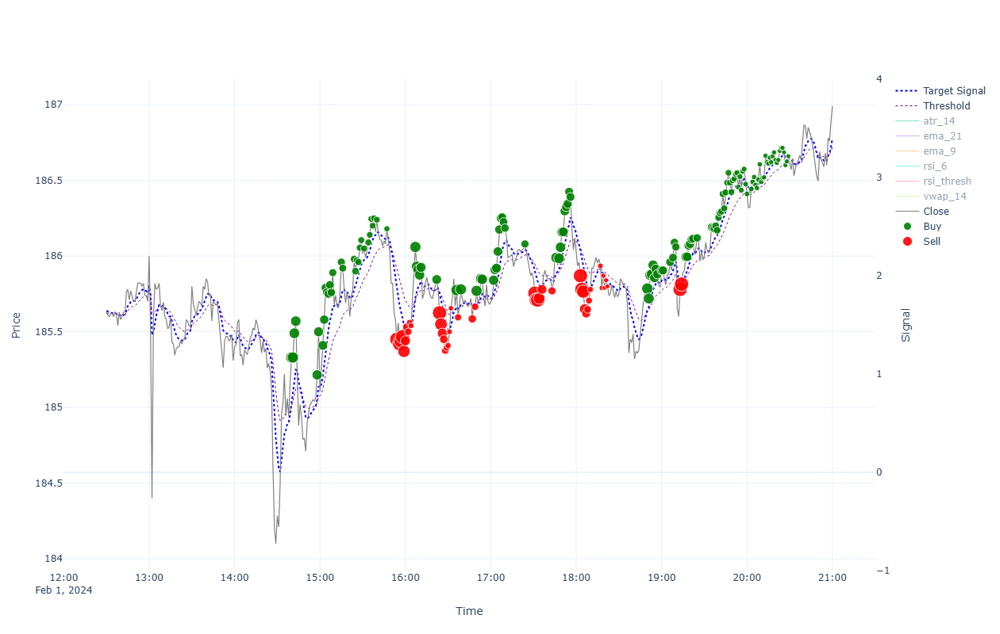


=== Performance for 2024-02-01 ===

INTRADAY:
  shares(542); [ask_buy=184.322, fee_buy=0.004, pos_amnt_buy=99904.614]; [bid_sell=186.953, fee_sell=0.018, pos_amnt_sell=101318.397]; PNL=1413.782
TRADES:
  Tr[1]: Time(14:40)Ask(185.367)Bid(185.293)Act(Buy)Shrs(28)Pos(28); CashTr(-5190.39)=Cost(-5190.278)-Fee(-0.112); P&L(99997.812)=CashTot(94809.61)+PosAmt(5188.202)
  Tr[2]: Time(14:41)Ask(185.367)Bid(185.293)Act(Buy)Shrs(27)Pos(55); CashTr(-5005.019)=Cost(-5004.911)-Fee(-0.108); P&L(99995.703)=CashTot(89804.591)+PosAmt(10191.111)
  Tr[3]: Time(14:42)Ask(185.527)Bid(185.453)Act(Buy)Shrs(25)Pos(80); CashTr(-4638.277)=Cost(-4638.177)-Fee(-0.1); P&L(100002.546)=CashTot(85166.314)+PosAmt(14836.232)
  Tr[4]: Time(14:43)Ask(185.607)Bid(185.533)Act(Buy)Shrs(24)Pos(104); CashTr(-4454.667)=Cost(-4454.571)-Fee(-0.096); P&L(100007.067)=CashTot(80711.647)+PosAmt(19295.42)
  Tr[5]: Time(14:58)Ask(185.252)Bid(185.178)Act(Buy)Shrs(23)Pos(127); CashTr(-4260.889)=Cost(-4260.797)-Fee(-0.092); P&L(99968.3

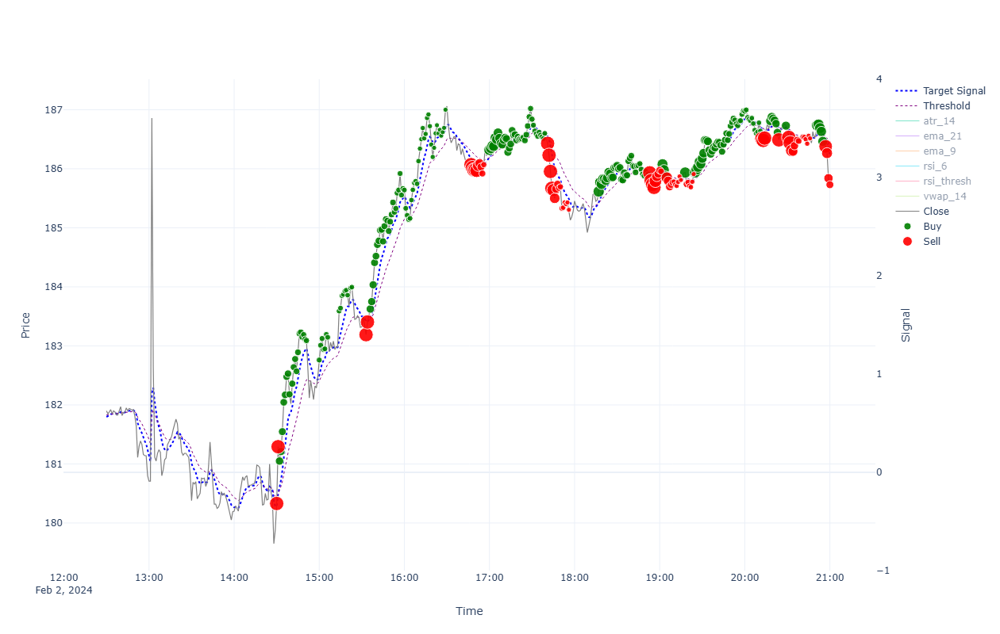


=== Performance for 2024-02-02 ===

INTRADAY:
  shares(561); [ask_buy=180.366, fee_buy=0.004, pos_amnt_buy=101187.607]; [bid_sell=185.693, fee_sell=0.018, pos_amnt_sell=104163.446]; PNL=2975.839
TRADES:
  Tr[1]: Time(14:30)Ask(180.366)Bid(180.294)Act(Sell)Shrs(161)Pos(373); CashTr(29024.403)=Cost(29027.323)-Fee(-2.92); P&L(96352.44)=CashTot(29102.802)+PosAmt(67249.637)
  Tr[2]: Time(14:31)Ask(181.329)Bid(181.256)Act(Sell)Shrs(112)Pos(261); CashTr(20298.665)=Cost(20300.699)-Fee(-2.034); P&L(96709.347)=CashTot(49401.468)+PosAmt(47307.879)
  Tr[3]: Time(14:32)Ask(181.086)Bid(181.014)Act(Buy)Shrs(15)Pos(276); CashTr(-2716.353)=Cost(-2716.293)-Fee(-0.06); P&L(96644.92)=CashTot(46685.114)+PosAmt(49959.806)
  Tr[4]: Time(14:33)Ask(181.246)Bid(181.174)Act(Buy)Shrs(14)Pos(290); CashTr(-2537.503)=Cost(-2537.447)-Fee(-0.056); P&L(96688.001)=CashTot(44147.611)+PosAmt(52540.39)
  Tr[5]: Time(14:34)Ask(181.584)Bid(181.511)Act(Buy)Shrs(13)Pos(303); CashTr(-2360.643)=Cost(-2360.591)-Fee(-0.052); P&L(

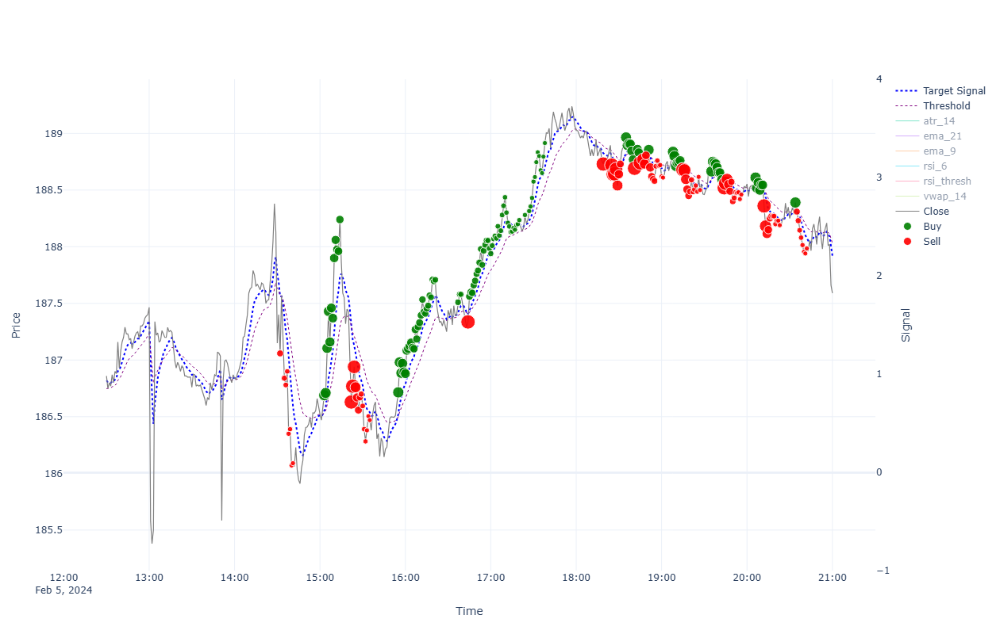


=== Performance for 2024-02-05 ===

INTRADAY:
  shares(556); [ask_buy=187.187, fee_buy=0.004, pos_amnt_buy=104078.435]; [bid_sell=187.552, fee_sell=0.018, pos_amnt_sell=104269.003]; PNL=190.568
TRADES:
  Tr[1]: Time(14:32)Ask(187.096)Bid(187.021)Act(Sell)Shrs(9)Pos(19); CashTr(1683.029)=Cost(1683.193)-Fee(-0.165); P&L(97825.967)=CashTot(94272.558)+PosAmt(3553.408)
  Tr[2]: Time(14:35)Ask(186.877)Bid(186.803)Act(Sell)Shrs(6)Pos(13); CashTr(1120.706)=Cost(1120.816)-Fee(-0.11); P&L(97821.699)=CashTot(95393.264)+PosAmt(2428.434)
  Tr[3]: Time(14:36)Ask(186.817)Bid(186.743)Act(Sell)Shrs(4)Pos(9); CashTr(746.897)=Cost(746.971)-Fee(-0.073); P&L(97820.846)=CashTot(96140.162)+PosAmt(1680.684)
  Tr[4]: Time(14:37)Ask(186.937)Bid(186.863)Act(Sell)Shrs(3)Pos(6); CashTr(560.533)=Cost(560.588)-Fee(-0.055); P&L(97821.87)=CashTot(96700.695)+PosAmt(1121.176)
  Tr[5]: Time(14:38)Ask(186.387)Bid(186.313)Act(Sell)Shrs(2)Pos(4); CashTr(372.589)=Cost(372.625)-Fee(-0.037); P&L(97818.534)=CashTot(97073.283)+

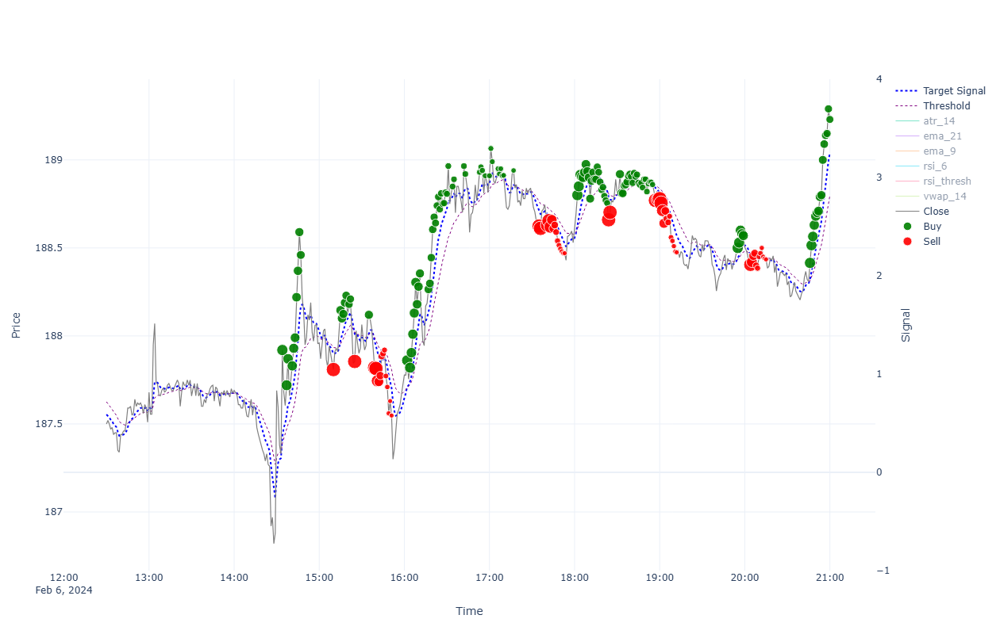


=== Performance for 2024-02-06 ===

INTRADAY:
  shares(555); [ask_buy=187.728, fee_buy=0.004, pos_amnt_buy=104191.004]; [bid_sell=189.192, fee_sell=0.018, pos_amnt_sell=104991.466]; PNL=800.462
TRADES:
  Tr[1]: Time(14:34)Ask(187.958)Bid(187.882)Act(Buy)Shrs(27)Pos(27); CashTr(-5074.963)=Cost(-5074.855)-Fee(-0.108); P&L(97975.763)=CashTot(92902.938)+PosAmt(5072.825)
  Tr[2]: Time(14:37)Ask(187.758)Bid(187.682)Act(Buy)Shrs(26)Pos(53); CashTr(-4881.8)=Cost(-4881.696)-Fee(-0.104); P&L(97968.308)=CashTot(88021.137)+PosAmt(9947.17)
  Tr[3]: Time(14:38)Ask(187.908)Bid(187.832)Act(Buy)Shrs(24)Pos(77); CashTr(-4509.878)=Cost(-4509.782)-Fee(-0.096); P&L(97974.357)=CashTot(83511.26)+PosAmt(14463.097)
  Tr[4]: Time(14:41)Ask(187.868)Bid(187.792)Act(Buy)Shrs(23)Pos(100); CashTr(-4321.046)=Cost(-4320.954)-Fee(-0.092); P&L(97969.457)=CashTot(79190.214)+PosAmt(18779.243)
  Tr[5]: Time(14:42)Ask(187.968)Bid(187.892)Act(Buy)Shrs(22)Pos(122); CashTr(-4135.375)=Cost(-4135.287)-Fee(-0.088); P&L(97977.713

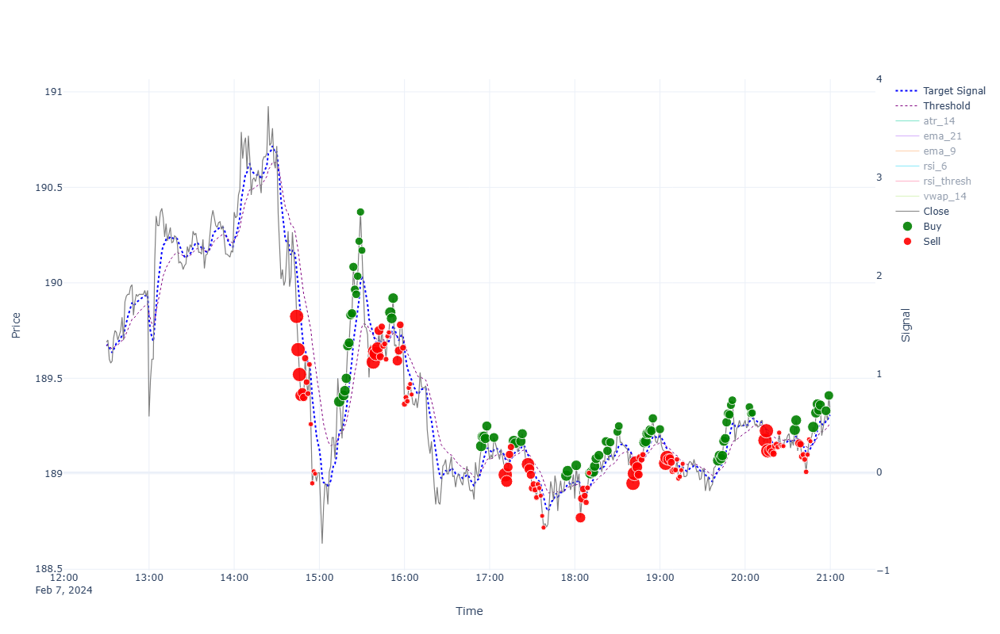


=== Performance for 2024-02-07 ===

INTRADAY:
  shares(550); [ask_buy=190.755, fee_buy=0.004, pos_amnt_buy=104917.309]; [bid_sell=189.282, fee_sell=0.018, pos_amnt_sell=104095.086]; PNL=-822.223
TRADES:
  Tr[1]: Time(14:44)Ask(189.862)Bid(189.786)Act(Sell)Shrs(87)Pos(202); CashTr(16509.797)=Cost(16511.394)-Fee(-1.597); P&L(97970.363)=CashTot(59633.563)+PosAmt(38336.799)
  Tr[2]: Time(14:45)Ask(189.688)Bid(189.612)Act(Sell)Shrs(61)Pos(141); CashTr(11565.217)=Cost(11566.336)-Fee(-1.119); P&L(97934.082)=CashTot(71198.78)+PosAmt(26735.302)
  Tr[3]: Time(14:46)Ask(189.558)Bid(189.482)Act(Sell)Shrs(43)Pos(98); CashTr(8146.941)=Cost(8147.73)-Fee(-0.789); P&L(97914.967)=CashTot(79345.721)+PosAmt(18569.245)
  Tr[4]: Time(14:47)Ask(189.448)Bid(189.372)Act(Sell)Shrs(30)Pos(68); CashTr(5680.616)=Cost(5681.167)-Fee(-0.55); P&L(97903.648)=CashTot(85026.337)+PosAmt(12877.311)
  Tr[5]: Time(14:48)Ask(189.464)Bid(189.388)Act(Sell)Shrs(21)Pos(47); CashTr(3976.765)=Cost(3977.15)-Fee(-0.385); P&L(97904.3

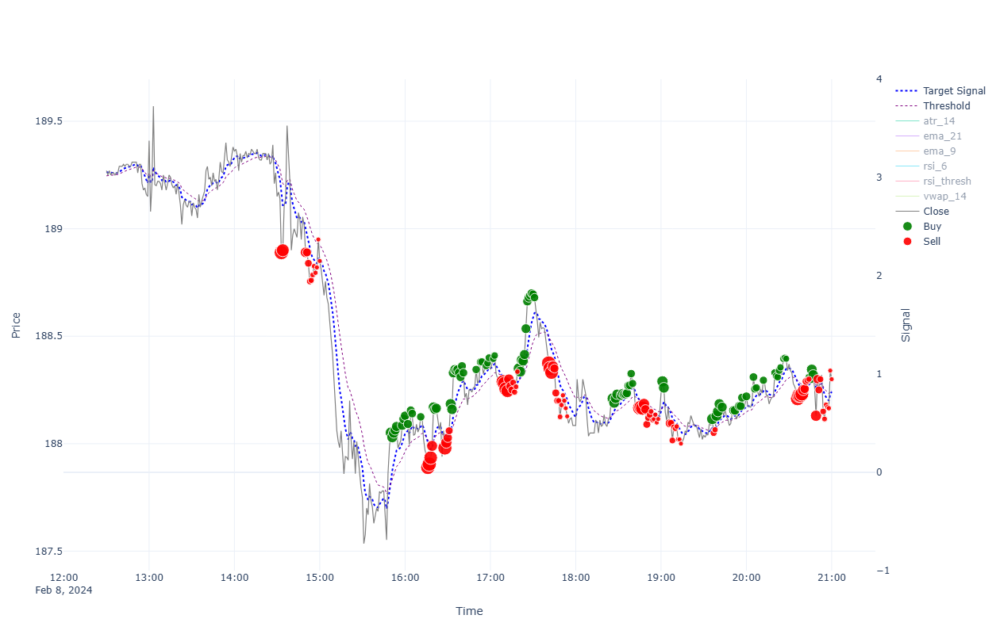


=== Performance for 2024-02-08 ===

INTRADAY:
  shares(550); [ask_buy=189.188, fee_buy=0.004, pos_amnt_buy=104055.506]; [bid_sell=188.262, fee_sell=0.018, pos_amnt_sell=103534.211]; PNL=-521.296
TRADES:
  Tr[1]: Time(14:33)Ask(188.927)Bid(188.851)Act(Sell)Shrs(49)Pos(113); CashTr(9252.821)=Cost(9253.72)-Fee(-0.898); P&L(97498.669)=CashTot(76158.458)+PosAmt(21340.211)
  Tr[2]: Time(14:34)Ask(188.938)Bid(188.862)Act(Sell)Shrs(34)Pos(79); CashTr(6420.692)=Cost(6421.315)-Fee(-0.623); P&L(97499.265)=CashTot(82579.15)+PosAmt(14920.115)
  Tr[3]: Time(14:50)Ask(188.928)Bid(188.852)Act(Sell)Shrs(24)Pos(55); CashTr(4532.013)=Cost(4532.453)-Fee(-0.44); P&L(97498.035)=CashTot(87111.163)+PosAmt(10386.872)
  Tr[4]: Time(14:51)Ask(188.928)Bid(188.852)Act(Sell)Shrs(17)Pos(38); CashTr(3210.176)=Cost(3210.488)-Fee(-0.312); P&L(97497.724)=CashTot(90321.339)+PosAmt(7176.384)
  Tr[5]: Time(14:52)Ask(188.877)Bid(188.801)Act(Sell)Shrs(12)Pos(26); CashTr(2265.396)=Cost(2265.616)-Fee(-0.22); P&L(97495.57)=Cas

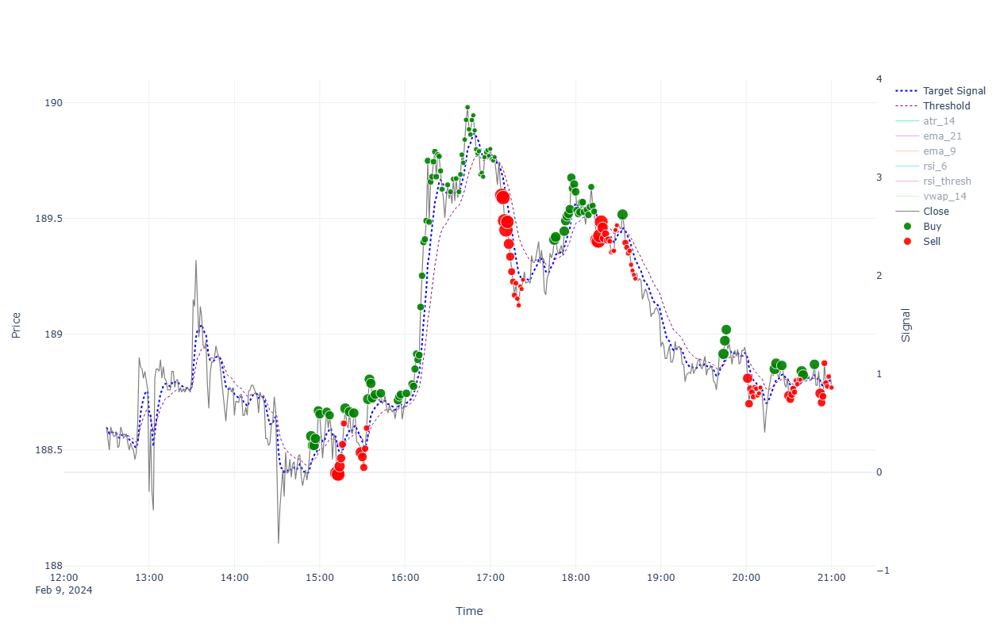


=== Performance for 2024-02-09 ===

INTRADAY:
  shares(549); [ask_buy=188.428, fee_buy=0.004, pos_amnt_buy=103448.991]; [bid_sell=188.732, fee_sell=0.018, pos_amnt_sell=103603.939]; PNL=154.948
TRADES:
  Tr[1]: Time(14:54)Ask(188.598)Bid(188.522)Act(Buy)Shrs(27)Pos(27); CashTr(-5092.246)=Cost(-5092.138)-Fee(-0.108); P&L(97190.799)=CashTot(92100.697)+PosAmt(5090.102)
  Tr[2]: Time(14:55)Ask(188.558)Bid(188.482)Act(Buy)Shrs(25)Pos(52); CashTr(-4714.043)=Cost(-4713.943)-Fee(-0.1); P&L(97187.734)=CashTot(87386.655)+PosAmt(9801.079)
  Tr[3]: Time(14:56)Ask(188.558)Bid(188.482)Act(Buy)Shrs(24)Pos(76); CashTr(-4525.481)=Cost(-4525.385)-Fee(-0.096); P&L(97185.828)=CashTot(82861.174)+PosAmt(14324.654)
  Tr[4]: Time(14:57)Ask(188.588)Bid(188.512)Act(Buy)Shrs(23)Pos(99); CashTr(-4337.609)=Cost(-4337.517)-Fee(-0.092); P&L(97186.281)=CashTot(78523.565)+PosAmt(18662.717)
  Tr[5]: Time(14:59)Ask(188.708)Bid(188.632)Act(Buy)Shrs(22)Pos(121); CashTr(-4151.658)=Cost(-4151.57)-Fee(-0.088); P&L(97196.411

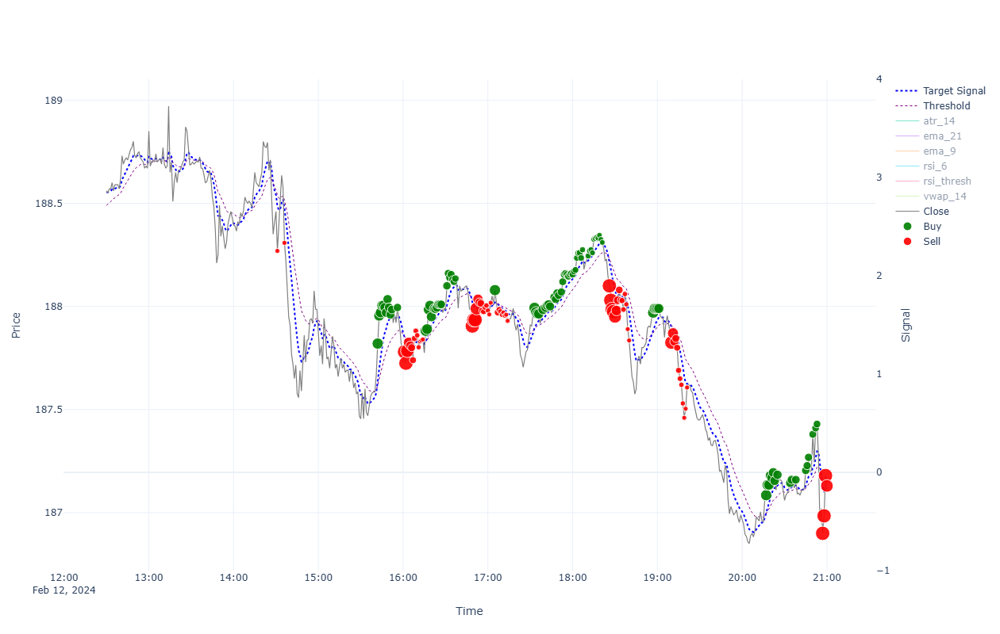


=== Performance for 2024-02-12 ===

INTRADAY:
  shares(549); [ask_buy=188.498, fee_buy=0.004, pos_amnt_buy=103487.429]; [bid_sell=187.093, fee_sell=0.018, pos_amnt_sell=102703.78]; PNL=-783.649
TRADES:
  Tr[1]: Time(14:31)Ask(188.307)Bid(188.231)Act(Sell)Shrs(1)Pos(1); CashTr(188.213)=Cost(188.231)-Fee(-0.018); P&L(97141.352)=CashTot(96953.121)+PosAmt(188.231)
  Tr[2]: Time(14:36)Ask(188.346)Bid(188.271)Act(Sell)Shrs(1)Pos(0); CashTr(188.252)=Cost(188.271)-Fee(-0.018); P&L(97141.373)=CashTot(97141.373)+PosAmt(0.0)
  Tr[3]: Time(15:42)Ask(187.858)Bid(187.782)Act(Buy)Shrs(27)Pos(27); CashTr(-5072.262)=Cost(-5072.154)-Fee(-0.108); P&L(97139.237)=CashTot(92069.111)+PosAmt(5070.126)
  Tr[4]: Time(15:43)Ask(187.993)Bid(187.917)Act(Buy)Shrs(25)Pos(52); CashTr(-4699.915)=Cost(-4699.815)-Fee(-0.1); P&L(97140.902)=CashTot(87369.196)+PosAmt(9771.705)
  Tr[5]: Time(15:44)Ask(188.008)Bid(187.933)Act(Buy)Shrs(24)Pos(76); CashTr(-4512.285)=Cost(-4512.189)-Fee(-0.096); P&L(97139.797)=CashTot(82856.91

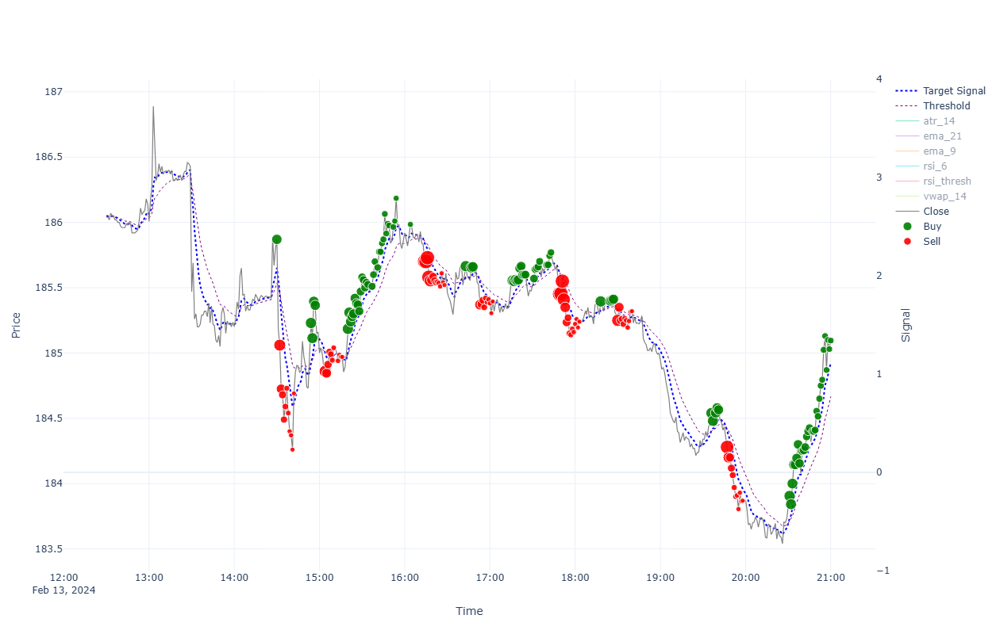


=== Performance for 2024-02-13 ===

INTRADAY:
  shares(552); [ask_buy=185.907, fee_buy=0.004, pos_amnt_buy=102622.968]; [bid_sell=185.058, fee_sell=0.018, pos_amnt_sell=102141.933]; PNL=-481.035
TRADES:
  Tr[1]: Time(14:30)Ask(185.907)Bid(185.833)Act(Buy)Shrs(23)Pos(97); CashTr(-4275.957)=Cost(-4275.865)-Fee(-0.092); P&L(96733.136)=CashTot(78707.352)+PosAmt(18025.784)
  Tr[2]: Time(14:32)Ask(185.097)Bid(185.023)Act(Sell)Shrs(30)Pos(67); CashTr(5550.142)=Cost(5550.69)-Fee(-0.547); P&L(96654.035)=CashTot(84257.494)+PosAmt(12396.54)
  Tr[3]: Time(14:33)Ask(184.762)Bid(184.688)Act(Sell)Shrs(21)Pos(46); CashTr(3878.066)=Cost(3878.449)-Fee(-0.383); P&L(96631.211)=CashTot(88135.56)+PosAmt(8495.651)
  Tr[4]: Time(14:34)Ask(184.717)Bid(184.643)Act(Sell)Shrs(14)Pos(32); CashTr(2584.748)=Cost(2585.003)-Fee(-0.255); P&L(96628.886)=CashTot(90720.308)+PosAmt(5908.578)
  Tr[5]: Time(14:35)Ask(184.527)Bid(184.453)Act(Sell)Shrs(10)Pos(22); CashTr(1844.349)=Cost(1844.531)-Fee(-0.182); P&L(96622.625)=Ca

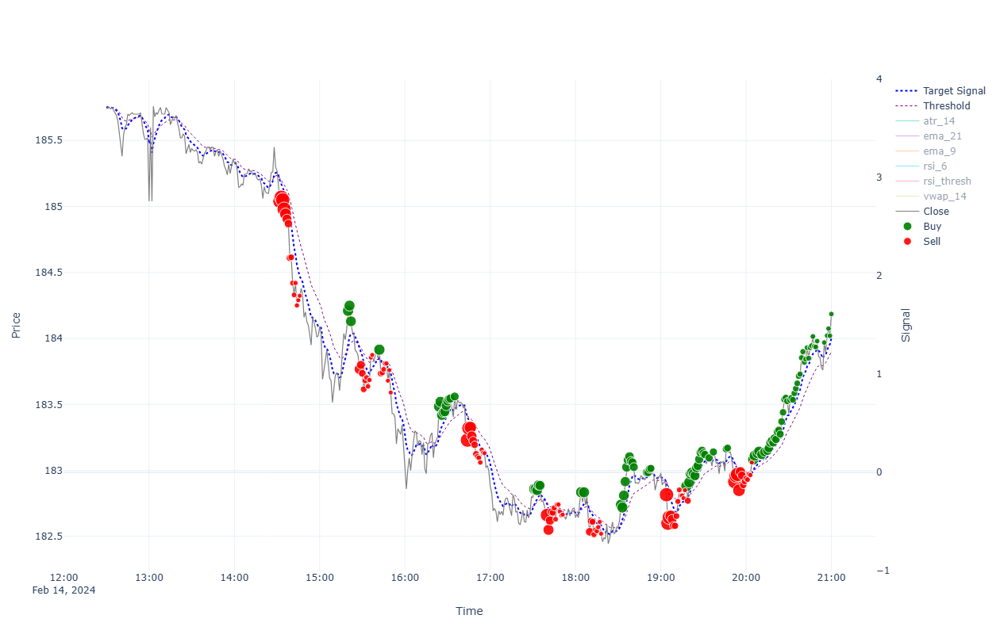


=== Performance for 2024-02-14 ===

INTRADAY:
  shares(551); [ask_buy=185.307, fee_buy=0.004, pos_amnt_buy=102106.391]; [bid_sell=184.148, fee_sell=0.018, pos_amnt_sell=101455.595]; PNL=-650.795
TRADES:
  Tr[1]: Time(14:32)Ask(185.077)Bid(185.003)Act(Sell)Shrs(125)Pos(289); CashTr(23123.093)=Cost(23125.374)-Fee(-2.281); P&L(96641.821)=CashTot(43175.956)+PosAmt(53465.865)
  Tr[2]: Time(14:33)Ask(185.107)Bid(185.033)Act(Sell)Shrs(87)Pos(202); CashTr(16096.282)=Cost(16097.87)-Fee(-1.587); P&L(96648.902)=CashTot(59272.239)+PosAmt(37376.663)
  Tr[3]: Time(14:34)Ask(185.087)Bid(185.013)Act(Sell)Shrs(61)Pos(141); CashTr(11284.679)=Cost(11285.792)-Fee(-1.113); P&L(96643.75)=CashTot(70556.918)+PosAmt(26086.832)
  Tr[4]: Time(14:35)Ask(185.017)Bid(184.943)Act(Sell)Shrs(43)Pos(98); CashTr(7951.765)=Cost(7952.549)-Fee(-0.785); P&L(96633.097)=CashTot(78508.683)+PosAmt(18124.414)
  Tr[5]: Time(14:36)Ask(184.98)Bid(184.906)Act(Sell)Shrs(30)Pos(68); CashTr(5546.633)=Cost(5547.18)-Fee(-0.547); P&L(966

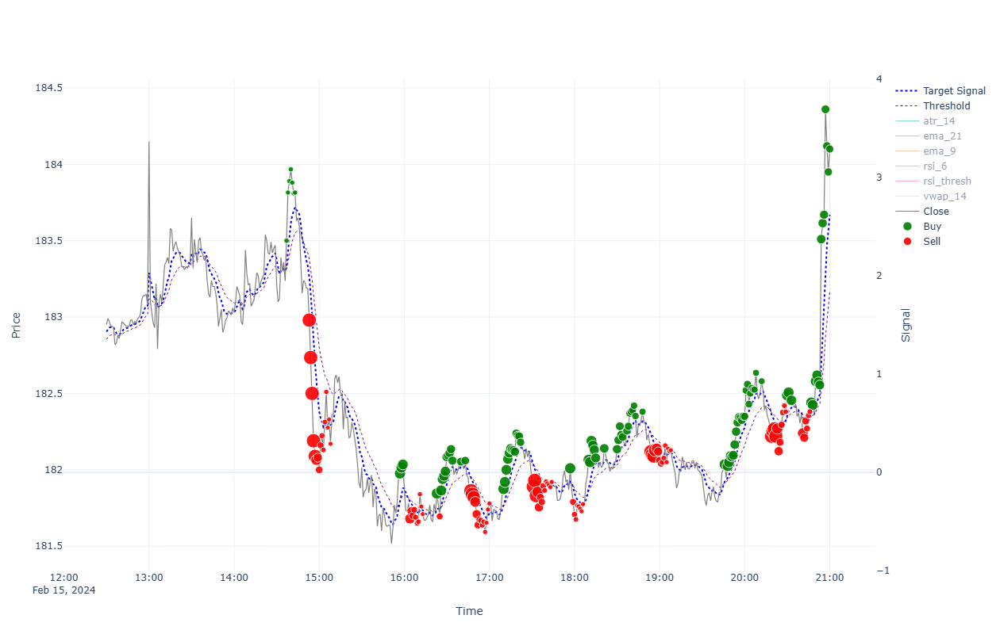


=== Performance for 2024-02-15 ===

INTRADAY:
  shares(553); [ask_buy=183.252, fee_buy=0.004, pos_amnt_buy=101340.371]; [bid_sell=184.063, fee_sell=0.018, pos_amnt_sell=101776.861]; PNL=436.49
TRADES:
  Tr[1]: Time(14:37)Ask(183.537)Bid(183.463)Act(Buy)Shrs(3)Pos(496); CashTr(-550.622)=Cost(-550.61)-Fee(-0.012); P&L(96289.991)=CashTot(5292.194)+PosAmt(90997.797)
  Tr[2]: Time(14:38)Ask(183.852)Bid(183.778)Act(Buy)Shrs(2)Pos(498); CashTr(-367.712)=Cost(-367.704)-Fee(-0.008); P&L(96446.045)=CashTot(4924.483)+PosAmt(91521.562)
  Tr[3]: Time(14:39)Ask(183.927)Bid(183.853)Act(Buy)Shrs(2)Pos(500); CashTr(-367.862)=Cost(-367.854)-Fee(-0.008); P&L(96483.232)=CashTot(4556.621)+PosAmt(91926.611)
  Tr[4]: Time(14:40)Ask(184.004)Bid(183.93)Act(Buy)Shrs(2)Pos(502); CashTr(-368.016)=Cost(-368.008)-Fee(-0.008); P&L(96521.619)=CashTot(4188.605)+PosAmt(92333.014)
  Tr[5]: Time(14:41)Ask(183.917)Bid(183.843)Act(Buy)Shrs(2)Pos(504); CashTr(-367.842)=Cost(-367.834)-Fee(-0.008); P&L(96477.749)=CashTot(382

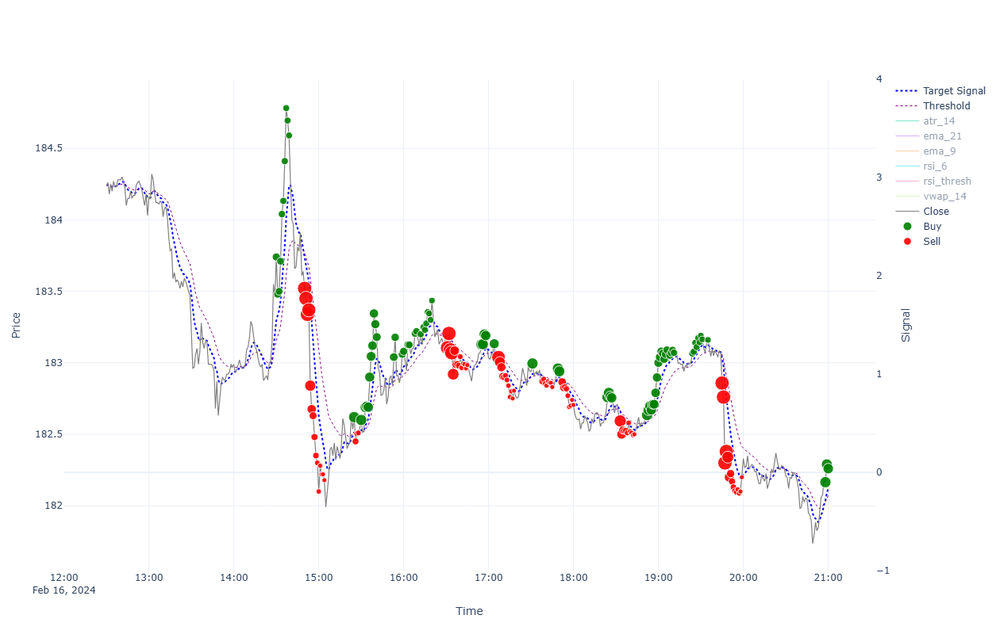


=== Performance for 2024-02-16 ===

INTRADAY:
  shares(553); [ask_buy=183.777, fee_buy=0.004, pos_amnt_buy=101630.754]; [bid_sell=182.224, fee_sell=0.018, pos_amnt_sell=100759.567]; PNL=-871.186
TRADES:
  Tr[1]: Time(14:30)Ask(183.777)Bid(183.703)Act(Buy)Shrs(14)Pos(283); CashTr(-2572.93)=Cost(-2572.874)-Fee(-0.056); P&L(95611.337)=CashTot(43623.317)+PosAmt(51988.02)
  Tr[2]: Time(14:31)Ask(183.516)Bid(183.443)Act(Buy)Shrs(13)Pos(296); CashTr(-2385.759)=Cost(-2385.707)-Fee(-0.052); P&L(95536.54)=CashTot(41237.558)+PosAmt(54298.981)
  Tr[3]: Time(14:32)Ask(183.537)Bid(183.463)Act(Buy)Shrs(12)Pos(308); CashTr(-2202.488)=Cost(-2202.44)-Fee(-0.048); P&L(95541.766)=CashTot(39035.07)+PosAmt(56506.696)
  Tr[4]: Time(14:33)Ask(183.747)Bid(183.673)Act(Buy)Shrs(12)Pos(320); CashTr(-2205.009)=Cost(-2204.961)-Fee(-0.048); P&L(95605.504)=CashTot(36830.061)+PosAmt(58775.443)
  Tr[5]: Time(14:34)Ask(184.077)Bid(184.003)Act(Buy)Shrs(11)Pos(331); CashTr(-2024.889)=Cost(-2024.845)-Fee(-0.044); P&L(9571

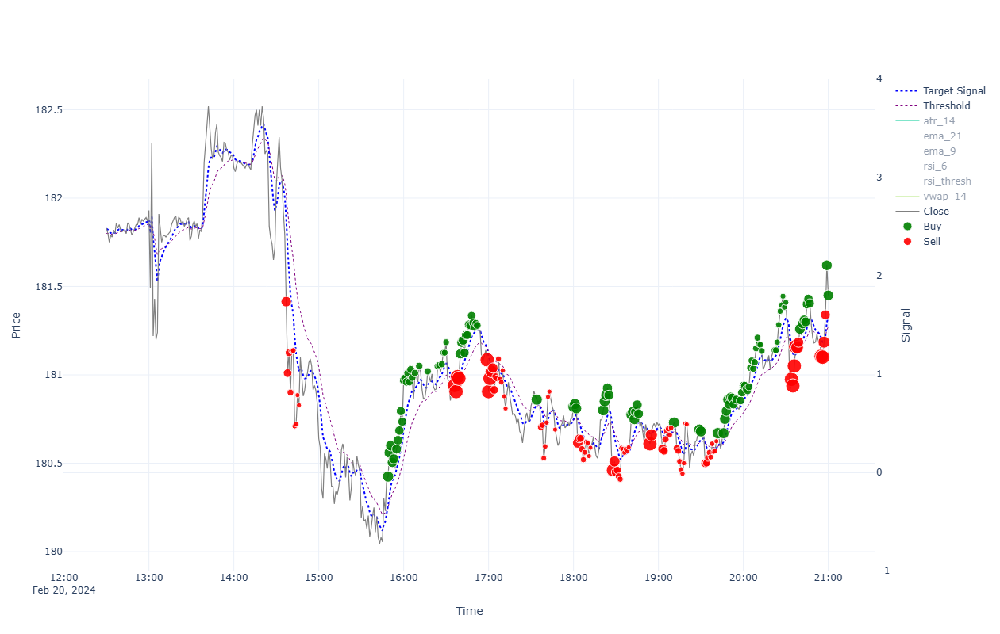


=== Performance for 2024-02-20 ===

INTRADAY:
  shares(553); [ask_buy=182.109, fee_buy=0.004, pos_amnt_buy=100708.276]; [bid_sell=181.414, fee_sell=0.018, pos_amnt_sell=100311.737]; PNL=-396.539
TRADES:
  Tr[1]: Time(14:37)Ask(181.45)Bid(181.378)Act(Sell)Shrs(24)Pos(53); CashTr(4352.632)=Cost(4353.068)-Fee(-0.436); P&L(95016.007)=CashTot(85402.982)+PosAmt(9613.024)
  Tr[2]: Time(14:38)Ask(181.046)Bid(180.974)Act(Sell)Shrs(16)Pos(37); CashTr(2895.29)=Cost(2895.581)-Fee(-0.29); P&L(94994.303)=CashTot(88298.273)+PosAmt(6696.031)
  Tr[3]: Time(14:39)Ask(181.161)Bid(181.089)Act(Sell)Shrs(12)Pos(25); CashTr(2172.847)=Cost(2173.065)-Fee(-0.218); P&L(94998.339)=CashTot(90471.12)+PosAmt(4527.219)
  Tr[4]: Time(14:40)Ask(180.936)Bid(180.864)Act(Sell)Shrs(8)Pos(17); CashTr(1446.765)=Cost(1446.911)-Fee(-0.145); P&L(94992.57)=CashTot(91917.885)+PosAmt(3074.685)
  Tr[5]: Time(14:41)Ask(181.171)Bid(181.099)Act(Sell)Shrs(6)Pos(11); CashTr(1086.484)=Cost(1086.593)-Fee(-0.109); P&L(94996.456)=CashTot(9

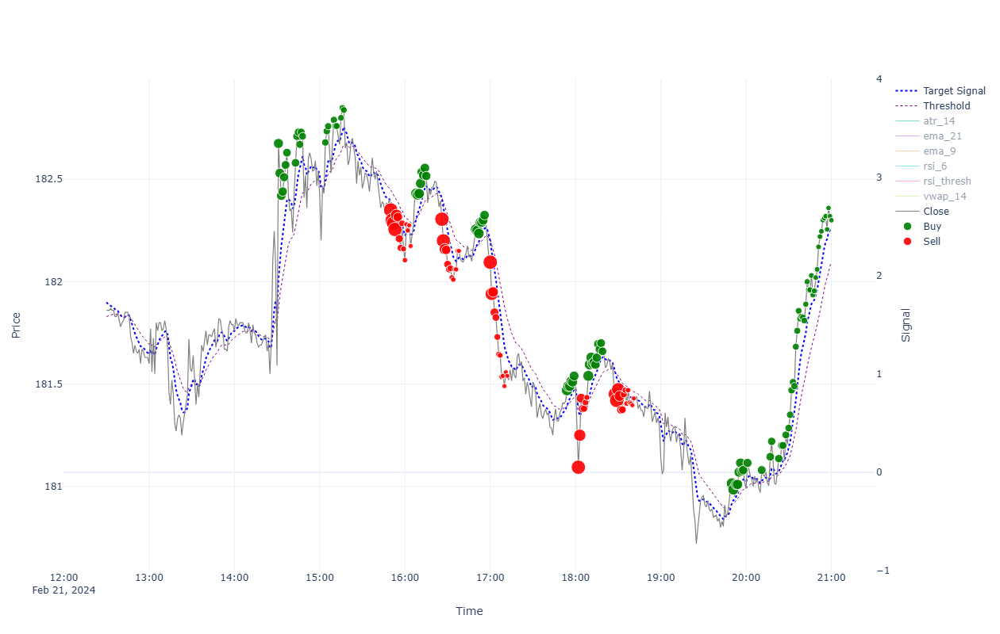


=== Performance for 2024-02-21 ===

INTRADAY:
  shares(552); [ask_buy=181.626, fee_buy=0.004, pos_amnt_buy=100259.936]; [bid_sell=182.264, fee_sell=0.018, pos_amnt_sell=100599.437]; PNL=339.502
TRADES:
  Tr[1]: Time(14:31)Ask(182.712)Bid(182.638)Act(Buy)Shrs(22)Pos(117); CashTr(-4019.742)=Cost(-4019.654)-Fee(-0.088); P&L(94890.095)=CashTot(73521.395)+PosAmt(21368.7)
  Tr[2]: Time(14:32)Ask(182.567)Bid(182.493)Act(Buy)Shrs(21)Pos(138); CashTr(-3833.981)=Cost(-3833.897)-Fee(-0.084); P&L(94871.516)=CashTot(69687.414)+PosAmt(25184.102)
  Tr[3]: Time(14:33)Ask(182.456)Bid(182.384)Act(Buy)Shrs(20)Pos(158); CashTr(-3649.21)=Cost(-3649.13)-Fee(-0.08); P&L(94854.8)=CashTot(66038.204)+PosAmt(28816.596)
  Tr[4]: Time(14:34)Ask(182.476)Bid(182.404)Act(Buy)Shrs(19)Pos(177); CashTr(-3467.129)=Cost(-3467.053)-Fee(-0.076); P&L(94856.497)=CashTot(62571.075)+PosAmt(32285.422)
  Tr[5]: Time(14:35)Ask(182.547)Bid(182.473)Act(Buy)Shrs(18)Pos(195); CashTr(-3285.909)=Cost(-3285.837)-Fee(-0.072); P&L(94867.4

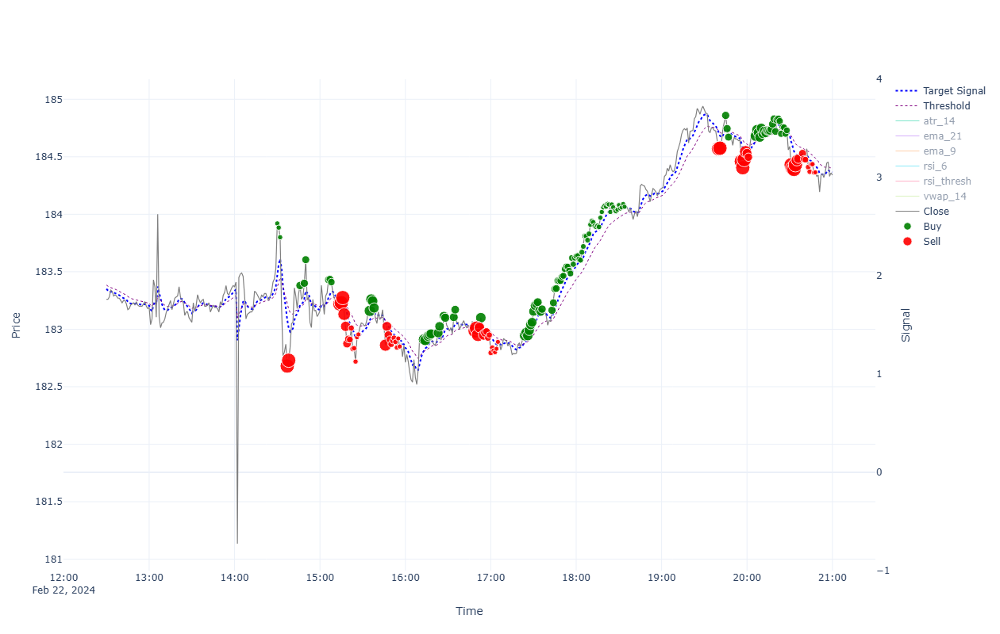


=== Performance for 2024-02-22 ===

INTRADAY:
  shares(546); [ask_buy=183.957, fee_buy=0.004, pos_amnt_buy=100442.588]; [bid_sell=184.303, fee_sell=0.018, pos_amnt_sell=100619.557]; PNL=176.969
TRADES:
  Tr[1]: Time(14:30)Ask(183.957)Bid(183.883)Act(Buy)Shrs(2)Pos(494); CashTr(-367.922)=Cost(-367.914)-Fee(-0.008); P&L(95687.231)=CashTot(4848.922)+PosAmt(90838.309)
  Tr[2]: Time(14:31)Ask(183.921)Bid(183.847)Act(Buy)Shrs(2)Pos(496); CashTr(-367.85)=Cost(-367.842)-Fee(-0.008); P&L(95669.295)=CashTot(4481.073)+PosAmt(91188.223)
  Tr[3]: Time(14:32)Ask(183.837)Bid(183.763)Act(Buy)Shrs(2)Pos(498); CashTr(-367.682)=Cost(-367.674)-Fee(-0.008); P&L(95627.485)=CashTot(4113.391)+PosAmt(91514.094)
  Tr[4]: Time(14:37)Ask(182.717)Bid(182.643)Act(Sell)Shrs(150)Pos(348); CashTr(27393.791)=Cost(27396.52)-Fee(-2.729); P&L(95067.108)=CashTot(31507.182)+PosAmt(63559.925)
  Tr[5]: Time(14:38)Ask(182.767)Bid(182.693)Act(Sell)Shrs(105)Pos(243); CashTr(19180.902)=Cost(19182.813)-Fee(-1.91); P&L(95082.594)=

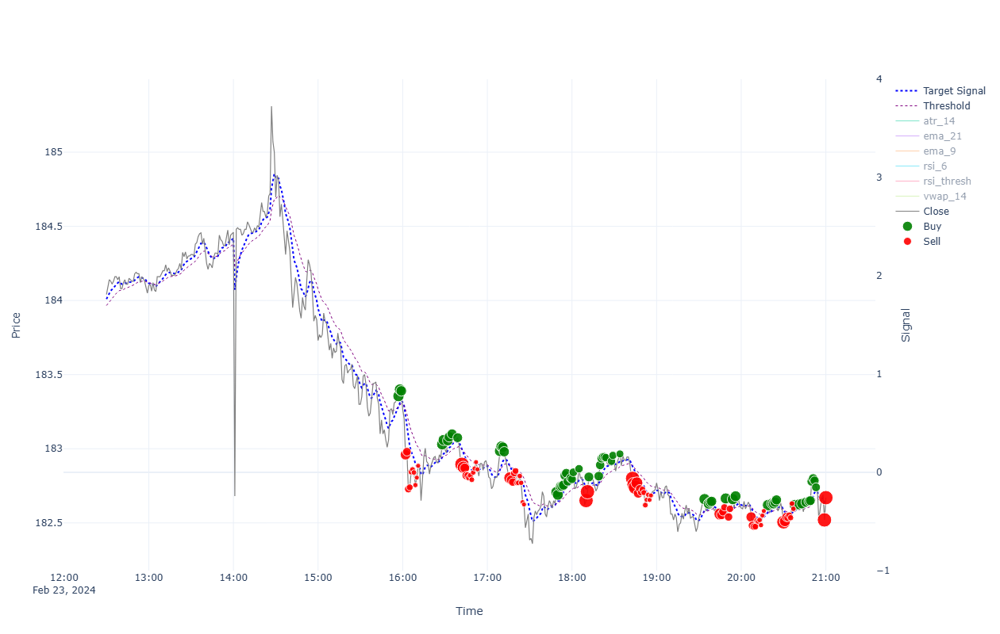


=== Performance for 2024-02-23 ===

INTRADAY:
  shares(544); [ask_buy=184.732, fee_buy=0.004, pos_amnt_buy=100496.351]; [bid_sell=182.633, fee_sell=0.018, pos_amnt_sell=99342.709]; PNL=-1153.641
TRADES:
  Tr[1]: Time(15:57)Ask(183.392)Bid(183.318)Act(Buy)Shrs(27)Pos(27); CashTr(-4951.683)=Cost(-4951.575)-Fee(-0.108); P&L(95487.35)=CashTot(90537.755)+PosAmt(4949.595)
  Tr[2]: Time(15:58)Ask(183.437)Bid(183.363)Act(Buy)Shrs(26)Pos(53); CashTr(-4769.46)=Cost(-4769.356)-Fee(-0.104); P&L(95486.556)=CashTot(85768.294)+PosAmt(9718.261)
  Tr[3]: Time(15:59)Ask(183.427)Bid(183.353)Act(Buy)Shrs(24)Pos(77); CashTr(-4402.336)=Cost(-4402.24)-Fee(-0.096); P&L(95484.164)=CashTot(81365.958)+PosAmt(14118.206)
  Tr[4]: Time(16:02)Ask(182.997)Bid(182.923)Act(Sell)Shrs(24)Pos(53); CashTr(4389.725)=Cost(4390.162)-Fee(-0.437); P&L(95450.624)=CashTot(85755.683)+PosAmt(9694.941)
  Tr[5]: Time(16:03)Ask(183.017)Bid(182.943)Act(Sell)Shrs(16)Pos(37); CashTr(2926.803)=Cost(2927.094)-Fee(-0.291); P&L(95451.393)=C

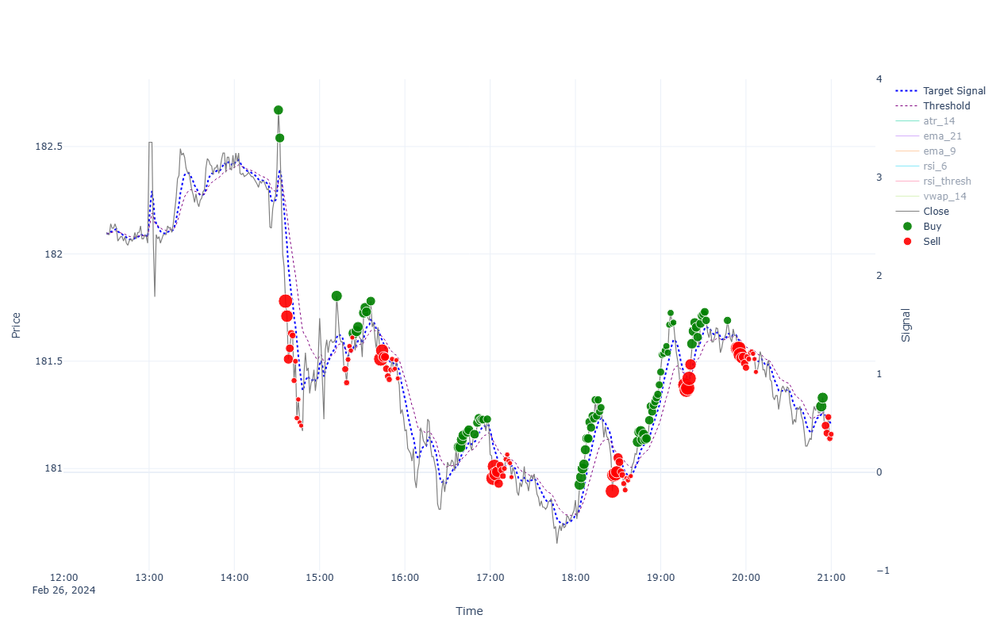


=== Performance for 2024-02-26 ===

INTRADAY:
  shares(544); [ask_buy=182.436, fee_buy=0.004, pos_amnt_buy=99247.621]; [bid_sell=181.124, fee_sell=0.018, pos_amnt_sell=98521.453]; PNL=-726.169
TRADES:
  Tr[1]: Time(14:31)Ask(182.707)Bid(182.633)Act(Buy)Shrs(22)Pos(130); CashTr(-4019.632)=Cost(-4019.544)-Fee(-0.088); P&L(95197.88)=CashTot(71455.529)+PosAmt(23742.351)
  Tr[2]: Time(14:32)Ask(182.577)Bid(182.503)Act(Buy)Shrs(21)Pos(151); CashTr(-3834.191)=Cost(-3834.107)-Fee(-0.084); P&L(95179.366)=CashTot(67621.339)+PosAmt(27558.027)
  Tr[3]: Time(14:36)Ask(181.816)Bid(181.744)Act(Sell)Shrs(46)Pos(105); CashTr(8359.372)=Cost(8360.208)-Fee(-0.836); P&L(95063.793)=CashTot(75980.71)+PosAmt(19083.083)
  Tr[4]: Time(14:37)Ask(181.746)Bid(181.674)Act(Sell)Shrs(32)Pos(73); CashTr(5812.979)=Cost(5813.56)-Fee(-0.581); P&L(95055.874)=CashTot(81793.689)+PosAmt(13262.184)
  Tr[5]: Time(14:38)Ask(181.546)Bid(181.474)Act(Sell)Shrs(22)Pos(51); CashTr(3992.022)=Cost(3992.421)-Fee(-0.4); P&L(95040.87)=C

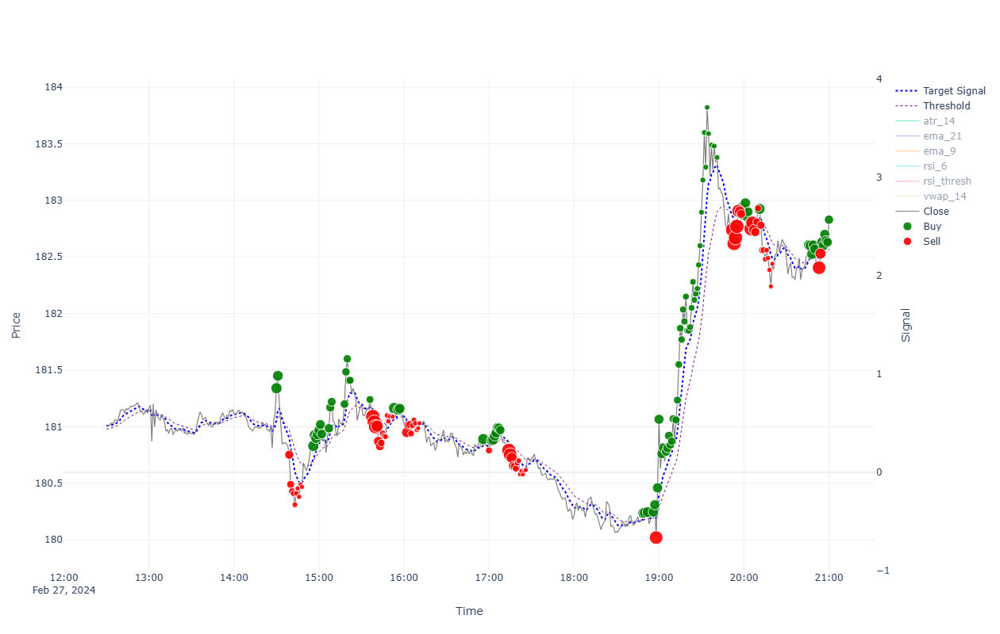


=== Performance for 2024-02-27 ===

INTRADAY:
  shares(543); [ask_buy=181.376, fee_buy=0.004, pos_amnt_buy=98489.486]; [bid_sell=182.793, fee_sell=0.018, pos_amnt_sell=99246.955]; PNL=757.469
TRADES:
  Tr[1]: Time(14:30)Ask(181.376)Bid(181.304)Act(Buy)Shrs(27)Pos(34); CashTr(-4897.267)=Cost(-4897.159)-Fee(-0.108); P&L(94771.036)=CashTot(88606.709)+PosAmt(6164.327)
  Tr[2]: Time(14:31)Ask(181.486)Bid(181.414)Act(Buy)Shrs(25)Pos(59); CashTr(-4537.257)=Cost(-4537.157)-Fee(-0.1); P&L(94772.86)=CashTot(84069.451)+PosAmt(10703.409)
  Tr[3]: Time(14:39)Ask(180.788)Bid(180.716)Act(Sell)Shrs(18)Pos(41); CashTr(3252.559)=Cost(3252.885)-Fee(-0.327); P&L(94731.36)=CashTot(87322.01)+PosAmt(7409.35)
  Tr[4]: Time(14:40)Ask(180.526)Bid(180.454)Act(Sell)Shrs(13)Pos(28); CashTr(2345.665)=Cost(2345.901)-Fee(-0.236); P&L(94720.384)=CashTot(89667.675)+PosAmt(5052.709)
  Tr[5]: Time(14:41)Ask(180.466)Bid(180.394)Act(Sell)Shrs(9)Pos(19); CashTr(1623.381)=Cost(1623.544)-Fee(-0.163); P&L(94718.538)=CashTot(9

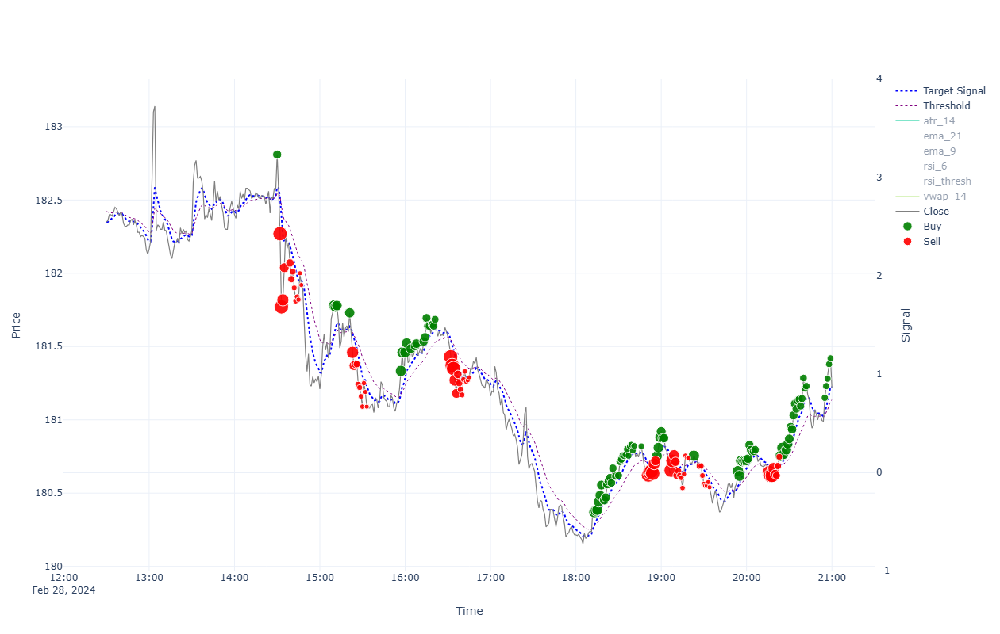


=== Performance for 2024-02-28 ===

INTRADAY:
  shares(542); [ask_buy=182.847, fee_buy=0.004, pos_amnt_buy=99105.005]; [bid_sell=181.184, fee_sell=0.018, pos_amnt_sell=98191.754]; PNL=-913.251
TRADES:
  Tr[1]: Time(14:30)Ask(182.847)Bid(182.773)Act(Buy)Shrs(18)Pos(206); CashTr(-3291.31)=Cost(-3291.238)-Fee(-0.072); P&L(95173.357)=CashTot(57522.029)+PosAmt(37651.328)
  Tr[2]: Time(14:32)Ask(182.306)Bid(182.234)Act(Sell)Shrs(62)Pos(144); CashTr(11297.353)=Cost(11298.48)-Fee(-1.127); P&L(95061.012)=CashTot(68819.381)+PosAmt(26241.631)
  Tr[3]: Time(14:33)Ask(181.807)Bid(181.734)Act(Sell)Shrs(44)Pos(100); CashTr(7995.512)=Cost(7996.311)-Fee(-0.8); P&L(94988.328)=CashTot(76814.893)+PosAmt(18173.435)
  Tr[4]: Time(14:34)Ask(181.855)Bid(181.782)Act(Sell)Shrs(31)Pos(69); CashTr(5634.674)=Cost(5635.237)-Fee(-0.563); P&L(94992.513)=CashTot(82449.567)+PosAmt(12542.947)
  Tr[5]: Time(14:35)Ask(182.074)Bid(182.001)Act(Sell)Shrs(21)Pos(48); CashTr(3821.65)=Cost(3822.031)-Fee(-0.382); P&L(95007.288)

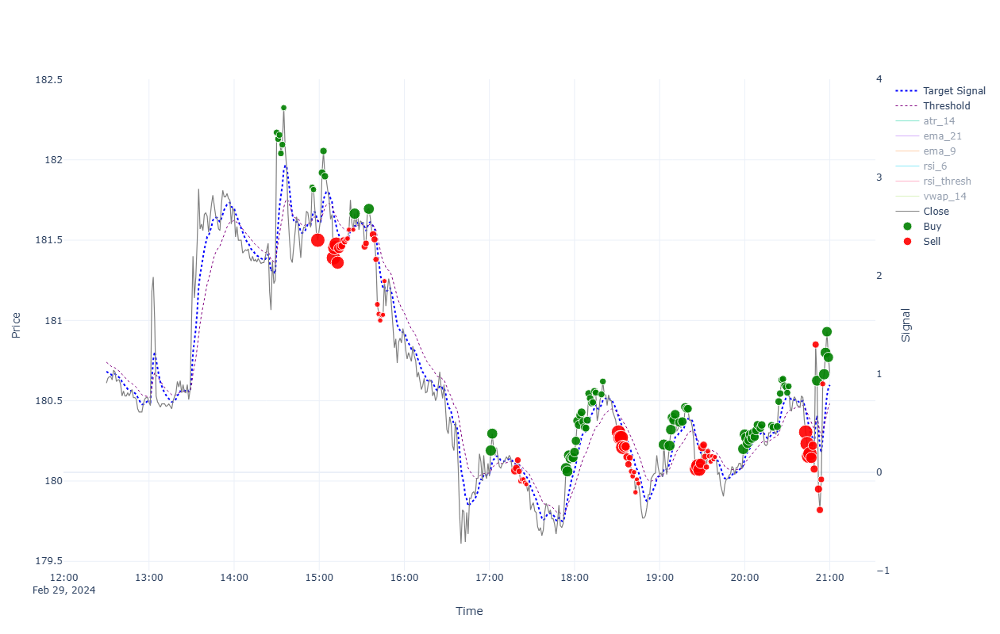


=== Performance for 2024-02-29 ===

INTRADAY:
  shares(538); [ask_buy=182.206, fee_buy=0.004, pos_amnt_buy=98029.213]; [bid_sell=180.634, fee_sell=0.018, pos_amnt_sell=97171.258]; PNL=-857.956
TRADES:
  Tr[1]: Time(14:30)Ask(182.206)Bid(182.134)Act(Buy)Shrs(8)Pos(389); CashTr(-1457.683)=Cost(-1457.651)-Fee(-0.032); P&L(95192.372)=CashTot(24342.415)+PosAmt(70849.957)
  Tr[2]: Time(14:31)Ask(182.166)Bid(182.094)Act(Buy)Shrs(8)Pos(397); CashTr(-1457.363)=Cost(-1457.331)-Fee(-0.032); P&L(95176.2)=CashTot(22885.051)+PosAmt(72291.149)
  Tr[3]: Time(14:32)Ask(182.191)Bid(182.119)Act(Buy)Shrs(7)Pos(404); CashTr(-1275.368)=Cost(-1275.34)-Fee(-0.028); P&L(95185.585)=CashTot(21609.683)+PosAmt(73575.902)
  Tr[4]: Time(14:33)Ask(182.076)Bid(182.004)Act(Buy)Shrs(7)Pos(411); CashTr(-1274.563)=Cost(-1274.535)-Fee(-0.028); P&L(95138.597)=CashTot(20335.121)+PosAmt(74803.476)
  Tr[5]: Time(14:34)Ask(182.131)Bid(182.058)Act(Buy)Shrs(7)Pos(418); CashTr(-1274.946)=Cost(-1274.918)-Fee(-0.028); P&L(95160.536

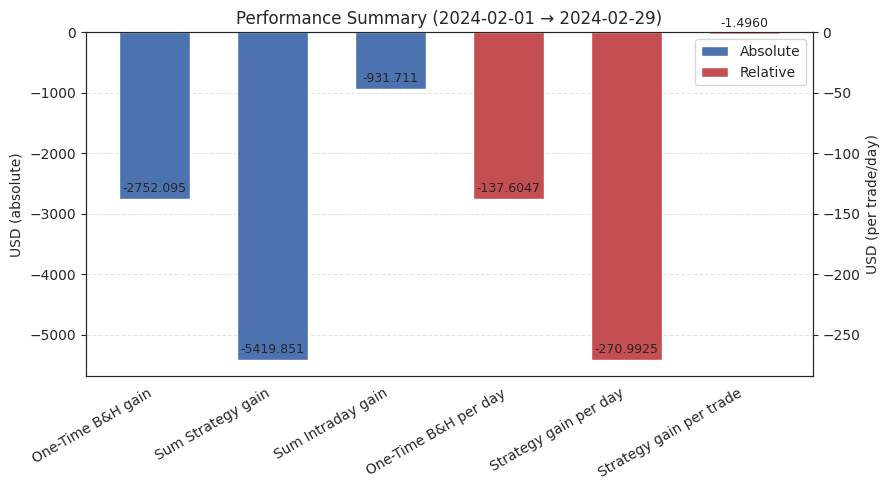


Overall Summary (2024-02-01 = 185.727 → 2024-02-29 = 180.634)
Num. trading days: 20
Trades Count: 3623
Initial capital: 100000.000

One-Time B&H gain: -2752.095 | final: 97247.905 | PnL%: -2.75%
Sum Strategy gain: -5419.851 | final: 94580.149 | PnL%: -5.42%
Sum Intraday gain: -931.711 | final: 99068.289 | PnL%: -0.93%

One-Time B&H gain per day: -137.6047
Strategy gain per day: -270.9925
Strategy gain per trade: -1.4960


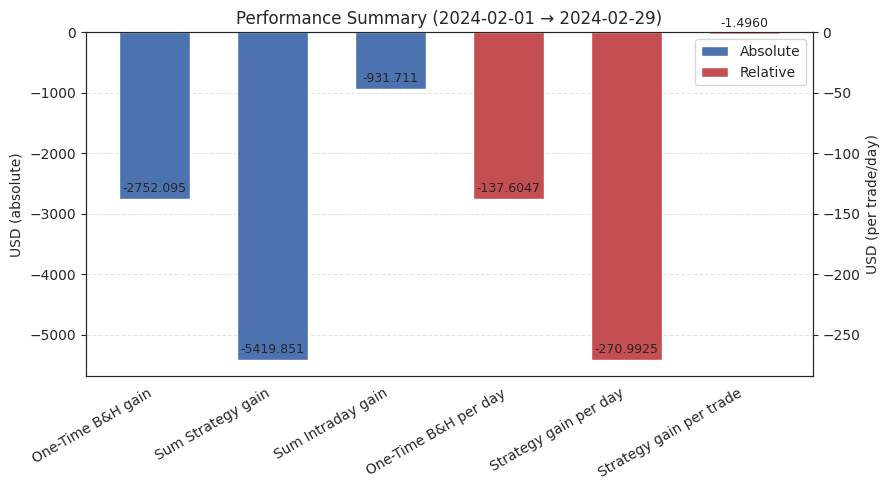

In [16]:
importlib.reload(params) ######
importlib.reload(plots) ######

df_month = df_inds_test[df_inds_test.index.to_period("M") == params.month_to_check]
year, month = map(int, params.month_to_check.split("-"))
days_in_month = [d for d in sim_results if d.year == year and d.month == month]

if not days_in_month:
    print(f"No simulation data for {params.month_to_check}")
else:
    for day in sorted(days_in_month):
        df_day_plot, trades_day, stats_day = sim_results[day]
        plots.plot_trades(
            df                 = df_day_plot,
            col_signal1        = col_signal,
            sign_thresh        = sign_thresh, 
            trades             = trades_day,
            performance_stats  = stats_day,
            features           = ['ema_9','ema_21','rsi_6', 'atr_14', 'vwap_14', 'rsi_thresh'],
            start_plot         = params.sess_start_shift,
            autoscale          = True
        )
        
        print(f"\n=== Performance for {day.strftime('%Y-%m-%d')} ===\n")
        
        for k, v in stats_day.items():
            lines = v if isinstance(v, list) else str(v).splitlines()
            print(f"{k}:")
            for L in lines:
                print("  " + L)
        print("\n" + "-" * 120 + "\n")

# monthly / overall aggregates
plots.aggregate_performance(perf_list = [sim_results[d][2] for d in sorted(days_in_month)], df= df_month)
plots.aggregate_performance(perf_list = [sim_results[d][2] for d in sorted(sim_results)], df = df_inds_test)


In [12]:
# Test 4 — inspect the arrays used for plotting markers
d = df_day_plot.copy()

# normalize exactly as plot_trades should
d["Action_norm"] = d.get("Action", d.get("action", pd.Series("", index=d.index))).astype(str).str.strip()
d["Action_lc"] = d["Action_norm"].str.lower()
d["Shares_num"] = pd.to_numeric(d.get("Shares", 0), errors="coerce").fillna(0).astype(float)

buy_mask  = d["Action_lc"].str.startswith("buy", na=False) & (d["Shares_num"] != 0)
sell_mask = d["Action_lc"].str.startswith("sell", na=False) & (d["Shares_num"] != 0)

# arrays that plot_trades uses
x_buy = d.index[buy_mask]
y_buy = d.loc[buy_mask, "close"]
sizes_buy = np.clip(np.nan_to_num(np.abs(d.loc[buy_mask, "Shares_num"].to_numpy()), nan=0.0) * 0.3 + 6, 6, 18)

x_sell = d.index[sell_mask]
y_sell = d.loc[sell_mask, "close"]
sizes_sell = np.clip(np.nan_to_num(np.abs(d.loc[sell_mask, "Shares_num"].to_numpy()), nan=0.0) * 0.3 + 6, 6, 18)

print("BUY arrays:")
print(" count x,y:", len(x_buy), len(y_buy))
print(" first 10 x:", list(x_buy[:10]))
print(" first 10 y:", list(y_buy[:10]))
print(" first 10 sizes:", list(sizes_buy[:10]))

print("\nSELL arrays:")
print(" count x,y:", len(x_sell), len(y_sell))
print(" first 10 x:", list(x_sell[:10]))
print(" first 10 y:", list(y_sell[:10]))
print(" first 10 sizes:", list(sizes_sell[:10]))


BUY arrays:
 count x,y: 79 79
 first 10 x: [Timestamp('2024-02-29 14:30:00'), Timestamp('2024-02-29 14:31:00'), Timestamp('2024-02-29 14:32:00'), Timestamp('2024-02-29 14:33:00'), Timestamp('2024-02-29 14:34:00'), Timestamp('2024-02-29 14:35:00'), Timestamp('2024-02-29 14:55:00'), Timestamp('2024-02-29 14:56:00'), Timestamp('2024-02-29 15:02:00'), Timestamp('2024-02-29 15:03:00')]
 first 10 y: [182.17, 182.13, 182.155, 182.04, 182.0947, 182.325, 181.83, 181.815, 181.92, 182.055]
 first 10 sizes: [8.1, 7.8, 7.8, 7.8, 7.8, 7.5, 7.5, 7.5, 8.1, 8.1]

SELL arrays:
 count x,y: 68 68
 first 10 x: [Timestamp('2024-02-29 14:59:00'), Timestamp('2024-02-29 15:10:00'), Timestamp('2024-02-29 15:11:00'), Timestamp('2024-02-29 15:12:00'), Timestamp('2024-02-29 15:13:00'), Timestamp('2024-02-29 15:14:00'), Timestamp('2024-02-29 15:15:00'), Timestamp('2024-02-29 15:16:00'), Timestamp('2024-02-29 15:17:00'), Timestamp('2024-02-29 15:18:00')]
 first 10 y: [181.5, 181.39, 181.4534, 181.4752, 181.36, 181.4